In [107]:
import os
import argparse
import json
import torch
import numpy as np
#from utils import show_box, show_mask, show_hbox_mask
import matplotlib.pyplot as plt
from PIL import Image
#from instance_to_json import binary_to_coco_gt_hrsc, binary_to_coco_pre_hrsc
import cv2

In [108]:
import sys 
sys.path.append("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/06.Gits/SAM_RS/Generate Dataset")
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.utils.transforms import ResizeLongestSide
from loaddata import load_hrsc, load_dota

In [109]:
sys.path.append("/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/00.Libs")
import RS_utils

In [110]:
import numpy as np
import xml.etree.ElementTree as ET
import os.path as osp
import easydict

In [111]:
args = easydict.EasyDict()
args['type'] = "center"
args['dataset'] = "hrsc"
#args['instance'] = "False"
args['semantic'] = "False"
args['show'] ="True"

EXE_TYPE = ".bmp"

In [112]:
sam_checkpoint = "/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/06.Gits/SAM_RS/Generate Dataset/SAM_ckpts/sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam = sam.to(device=device)
predictor = SamPredictor(sam)

In [113]:
img_path = "/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/06.Gits/01.SAMRS_MTP/MTP/MMRotate_1_x/demo_/18__1840_1840.png"
label_path = "/mnt/hdd/eric/.tmp_ipy/15.Lab_Detection/06.Gits/01.SAMRS_MTP/MTP/MMRotate_1_x/demo_/18__1840_1840.txt"

In [114]:
img = np.array(Image.open(img_path))

In [115]:
label_ = RS_utils.read_txt(label_path)

In [116]:
gt_hboxes = []
for box in label_:
    #print(box)
    a = box.split(" ")[:8]
    a = np.asarray([float(i) for i in a])
    a = a.reshape(-1,2)
    gt_hboxes.append(a)

In [117]:
gt_hboxes[0].shape

(4, 2)

In [118]:
gt_rboxes = np.stack(gt_hboxes, axis=0)

In [119]:
gt_rboxes.shape

(9, 4, 2)

In [120]:
xmin = np.min(gt_rboxes[:,:,0], axis=1)
ymin = np.min(gt_rboxes[:,:,1], axis=1)
xmax = np.max(gt_rboxes[:,:,0], axis=1)
ymax = np.max(gt_rboxes[:,:,1], axis=1)
gt_rhboxes = np.stack([xmin, ymin, xmax, ymax], axis=1) # b,4

In [121]:
gt_rhboxes

array([[568., 597., 586., 613.],
       [567., 600., 661., 702.],
       [306., 673., 324., 685.],
       [290., 683., 308., 695.],
       [305., 839., 323., 857.],
       [492., 636., 550., 722.],
       [443., 699., 505., 785.],
       [402., 700., 514., 848.],
       [212., 786., 282., 880.]])

In [122]:
gt_rhboxes = torch.from_numpy(gt_rhboxes).cuda()

In [123]:
predictor.set_image(img)
transformed_boxes = predictor.transform.apply_boxes_torch(gt_rhboxes, img.shape[:2])

In [124]:
transformed_boxes

tensor([[625.4108, 657.3419, 645.2301, 674.9592],
        [624.3097, 660.6452, 727.8108, 772.9548],
        [336.9290, 741.0237, 356.7484, 754.2366],
        [319.3118, 752.0344, 339.1312, 765.2473],
        [335.8280, 923.8022, 355.6473, 943.6215],
        [541.7291, 700.2839, 605.5914, 794.9764],
        [487.7764, 769.6516, 556.0430, 864.3441],
        [442.6323, 770.7527, 565.9527, 933.7119],
        [233.4280, 865.4452, 310.5032, 968.9462]], device='cuda:0')

In [125]:
sam_masks, qualities, lr_logits = predictor.predict_torch(
    point_coords = None,#gt_points[:,None,:],
    point_labels= None,#input_labels[:, None],
    boxes=transformed_boxes,
    mask_input=None,#,rhbox_mask_prompts[:,None,:,:],
    multimask_output=False) # 只输出一个mask

In [126]:
sam_masks = sam_masks.squeeze(1) # b, h, w

In [127]:
sam_masks = sam_masks.cpu().numpy()

In [128]:
sam_masks.shape

(9, 930, 930)

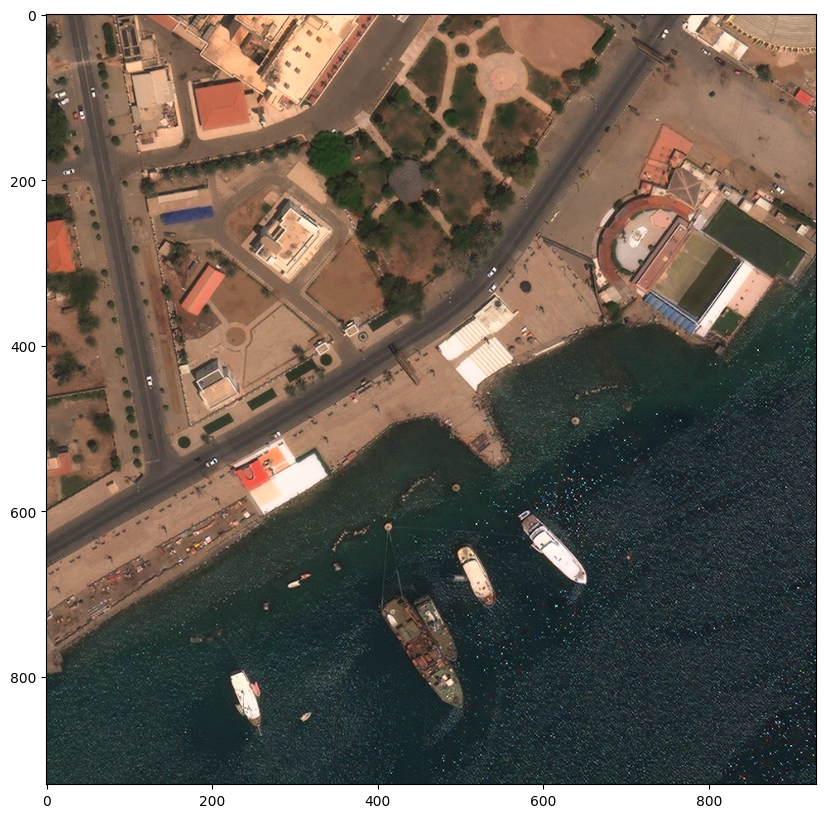

In [129]:
plt.figure(figsize=(10,10))
plt.imshow(img)

In [130]:
sam_masks.shape

(9, 930, 930)

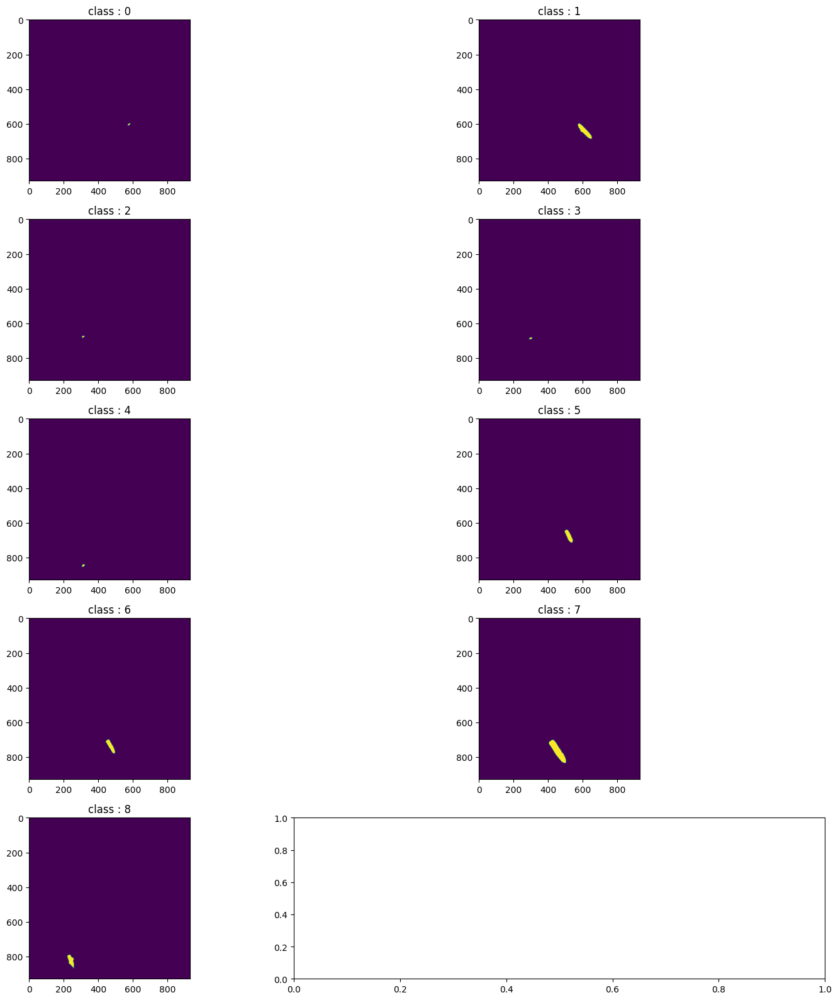

In [131]:
RS_utils.label_display(sam_masks, n_class = sam_masks.shape[0], nrows= int(np.ceil(sam_masks.shape[0] / 2)) , ncols = 2 , channel_order='torch', batch=False)

(0, 255, 0)
(0, 0, 255)
(255, 255, 0)
(255, 0, 0)
(0, 255, 0)
(0, 0, 255)
(255, 255, 0)
(255, 0, 0)
(0, 255, 0)


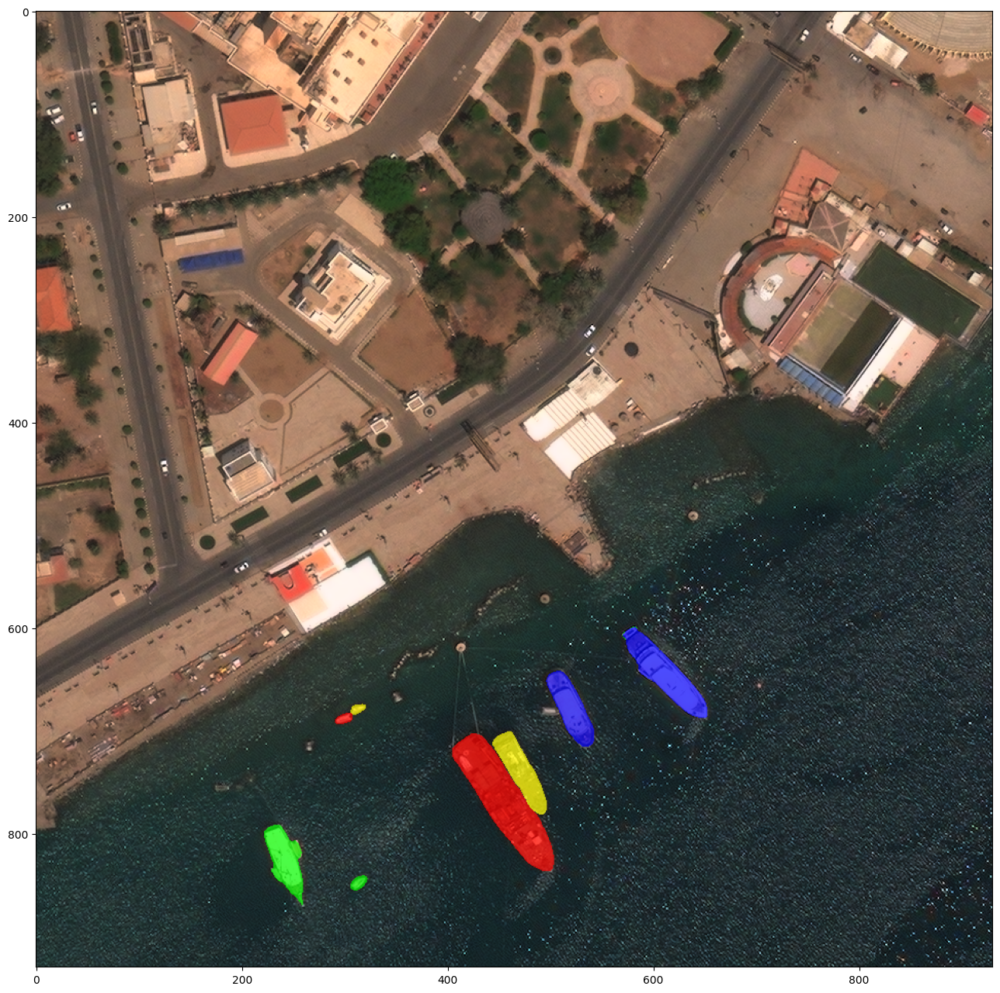

In [132]:
LABELS = [[0], [0]] 
    
COLORS = [
    (255, 0, 0),    # Red
    (0, 255, 0),    # Green
    (0, 0, 255),    # Blue
    (255, 255, 0),  # Yellow
]
segmented_image = RS_utils.draw_masks_fromList(img, [i for i in sam_masks], labels = LABELS, colors=COLORS)

plt.figure(figsize=(16,16))
plt.imshow(segmented_image)

In [133]:
segmented_image.shape

(930, 930, 3)

In [134]:
#--- show rotated gt box 
# 일단은, 저게 마스킹 자체가, rotated box가 아니라 h box 기준이니까, 
gt_rboxes = []
for box in label_:
    #print(box)
    a = box.split(" ")[:8]
    a = np.asarray([float(i) for i in a])
    #a = a.reshape(-1,2)
    gt_rboxes.append(a)

In [135]:
gt_rhboxes = np.asarray(gt_rhboxes.detach().cpu())

In [136]:
gt_rhboxes

array([[568., 597., 586., 613.],
       [567., 600., 661., 702.],
       [306., 673., 324., 685.],
       [290., 683., 308., 695.],
       [305., 839., 323., 857.],
       [492., 636., 550., 722.],
       [443., 699., 505., 785.],
       [402., 700., 514., 848.],
       [212., 786., 282., 880.]])

In [137]:
img.shape[0:2]

(930, 930)

In [138]:
def convert(box):
    
    xmin = box[0]
    ymin = box[1]
    
    xmax = box[2]
    ymax = box[3]
    
    width = xmax - xmin
    height= ymax - ymin
    
    center_x = xmin + width/2
    center_y = ymin + height/2
    
    return np.array([center_x,center_y, width, height])


gt_rhboxes_converted = [convert(box) for box in gt_rhboxes]

In [139]:
gt_rhboxes_converted[0]

array([577., 605.,  18.,  16.])

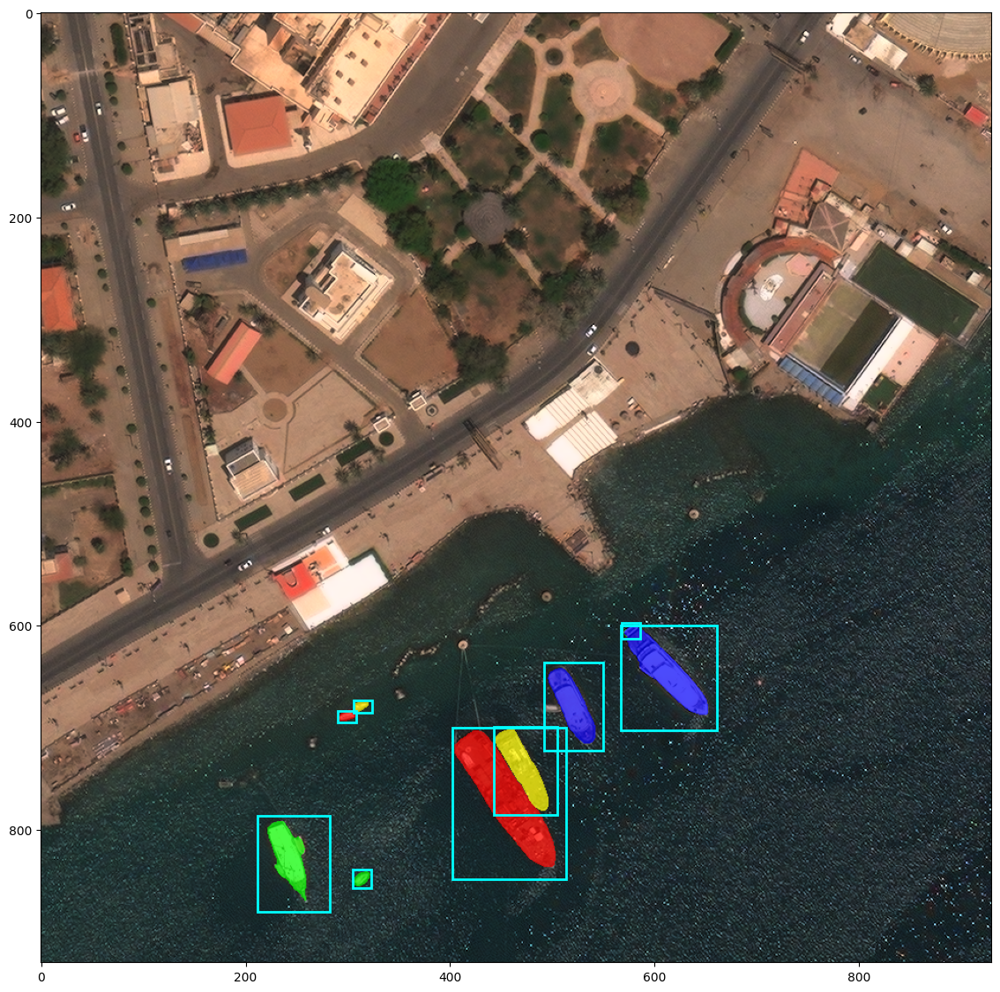

In [140]:
'''

Show with horizontal boxes 

'''

import matplotlib.patches as patches

plt.figure(figsize=(14,14))
plt.imshow(segmented_image)


ax = plt.gca()
for box_ in gt_rhboxes_converted:
    x = box_[0]
    y = box_[1]
    width = box_[2]
    height = box_[3]
    #angle_ = box_[4]

    # model 의 객체좌표가 center 중심인데, patches.Rectangle 은 좌하단을 기준점으로 보기 때문에. x,y 를 아래와 같이 shift 
    # roatate 할 때, 중심좌표 center 로 잡고, angle radian 변환해서 넣어주기 

    path_obj = patches.Rectangle((x-width*0.5,y-height*0.5), width, height, linewidth=2, edgecolor="cyan", fill=False,
                                 
                                 )
    
    ax.add_patch(path_obj)

plt.show()

In [141]:
#----- Rotated Box version 
#--- show rotated gt box 
# 일단은, 저게 마스킹 자체가, rotated box가 아니라 h box 기준이니까, 
gt_rboxes = []
for box in label_:
    #print(box)
    a = box.split(" ")[:8]
    a = np.asarray([float(i) for i in a])
    #a = a.reshape(-1,2)
    gt_rboxes.append(a)

In [142]:
box_poly = [box.reshape(-1,2) for box in gt_rboxes]

In [143]:
box_poly[0].shape

(4, 2)

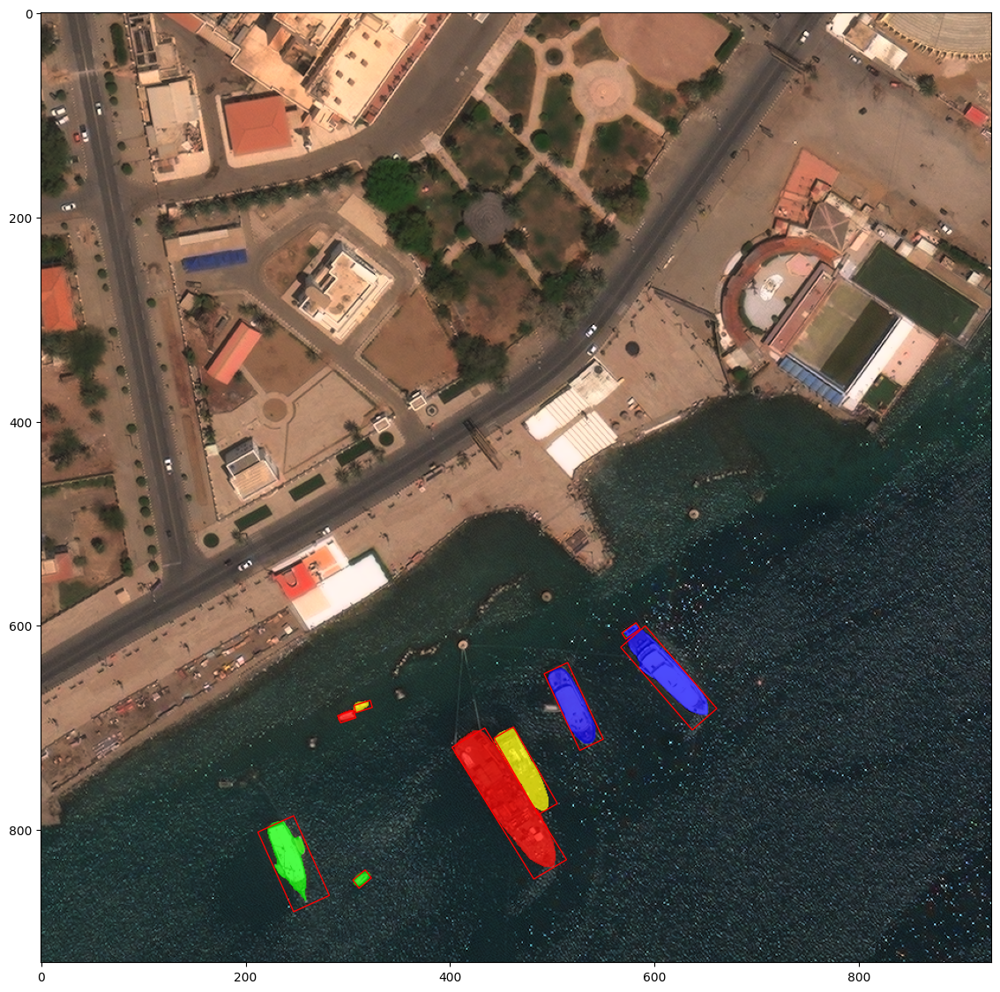

In [144]:
'''

Show with Rotated boxes 

'''

import matplotlib.patches as patches

plt.figure(figsize=(14,14))
plt.imshow(segmented_image)

ax = plt.gca()
for a_poly in box_poly:
    
    patch_obj = patches.Polygon(a_poly, fill=False,linestyle='-',linewidth=1,edgecolor='red')
    ax.add_patch(patch_obj)
plt.show()